<a href="https://colab.research.google.com/github/Sidsarkar22/Prompt-AI/blob/main/Project_StableDiffusion_imageGeneration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Mar 25 20:29:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install diffusers==0.2.4
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

  Using cached diffusers-0.2.4-py3-none-any.whl (112 kB)
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.27.2
    Uninstalling diffusers-0.27.2:
      Successfully uninstalled diffusers-0.27.2


In [3]:
from google.colab import output
output.enable_custom_widget_manager()

Now you can login with your user token.

In [4]:
from huggingface_hub import notebook_login

notebook_login()

In [5]:
!pip install --upgrade diffusers

from diffusers import StableDiffusionPipeline

  Using cached diffusers-0.27.2-py3-none-any.whl (2.0 MB)
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.2.4
    Uninstalling diffusers-0.2.4:
      Successfully uninstalled diffusers-0.2.4


The cache for model files in Diffusers v0.14.0 has moved to a new location. Moving your existing cached models. This is a one-time operation, you can interrupt it or run it later by calling `diffusers.utils.hub_utils.move_cache()`.


In [6]:
import torch
from diffusers import StableDiffusionPipeline

# Make sure you're logged in with `huggingface-cli login`
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    use_auth_token=True,
    torch_dtype=torch.float16  # Moved torch_dtype as a separate argument
)


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:212: FutureWarning: You are loading the variant fp16 from CompVis/stable-diffusion-v1-4 via `r

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


Next, let's move the pipeline to GPU to have faster inference.

In [7]:
pipe = pipe.to("cuda")

In [10]:
print(pipe(prompt).keys())


  0%|          | 0/50 [00:00<?, ?it/s]

odict_keys(['images', 'nsfw_content_detected'])


  0%|          | 0/50 [00:00<?, ?it/s]

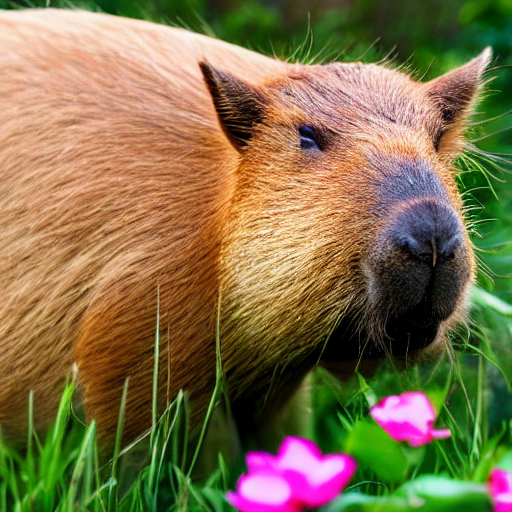

In [20]:
from torch import autocast

prompt = "a photograph of a capybara with flowers"
with autocast("cuda"):
  image = pipe(prompt)["images"][0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can do either save it such as:
image.save(f"capy_flies.png")

# or if you're in a google colab you can directly display it with
image

  0%|          | 0/50 [00:00<?, ?it/s]

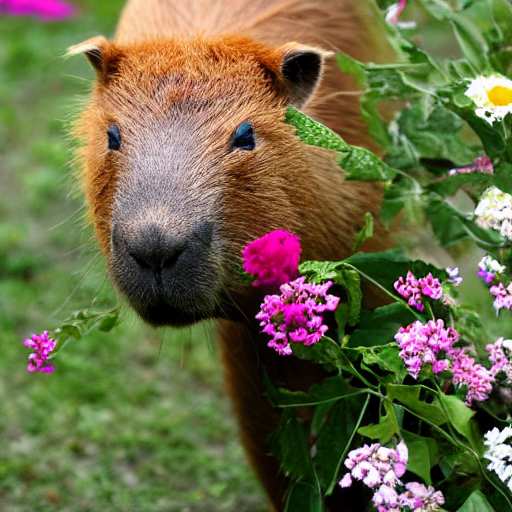

In [22]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

with autocast("cuda"):
  image = pipe(prompt, generator=generator)["images"][0]

image

  0%|          | 0/15 [00:00<?, ?it/s]

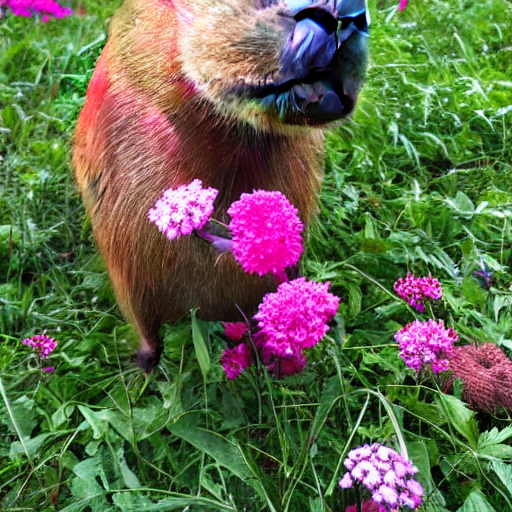

In [24]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

with autocast("cuda"):
  image = pipe(prompt, num_inference_steps=15, generator=generator)["images"][0]

image

  0%|          | 0/200 [00:00<?, ?it/s]

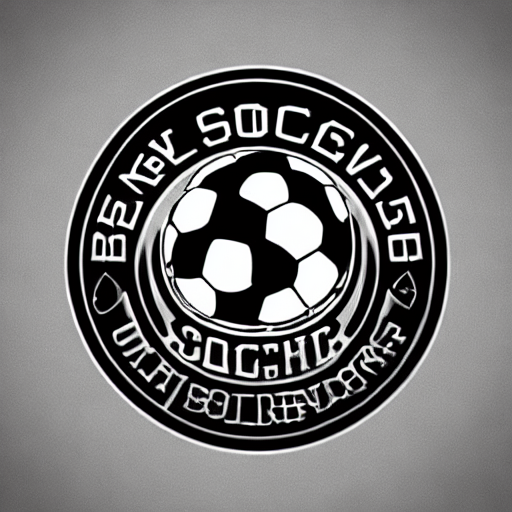

In [26]:
generator = torch.Generator("cuda").manual_seed(1024)

prompt = "new company logo for soccer brand 'knuckle'"

with autocast("cuda"):
  image = pipe(prompt, num_inference_steps=200, generator=generator)["images"][0]

image

In [27]:
image.save(f"knuckle_logo.png")

In [28]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

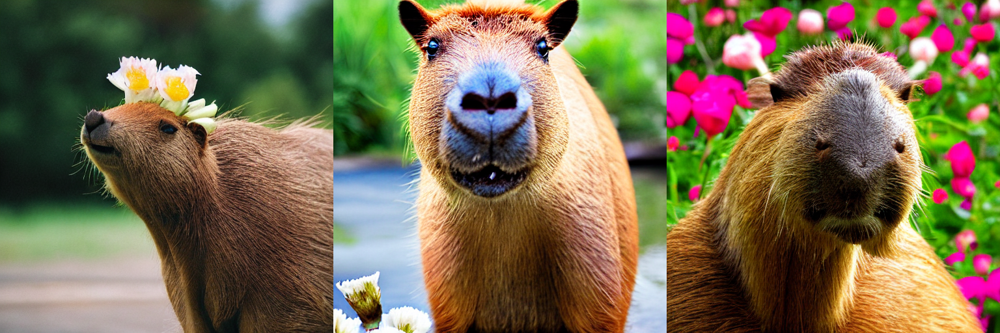

In [29]:
num_images = 3
prompt = ["a photograph of a capybara with flowers"] * num_images

with autocast("cuda"):
  images = pipe(prompt)["images"]

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

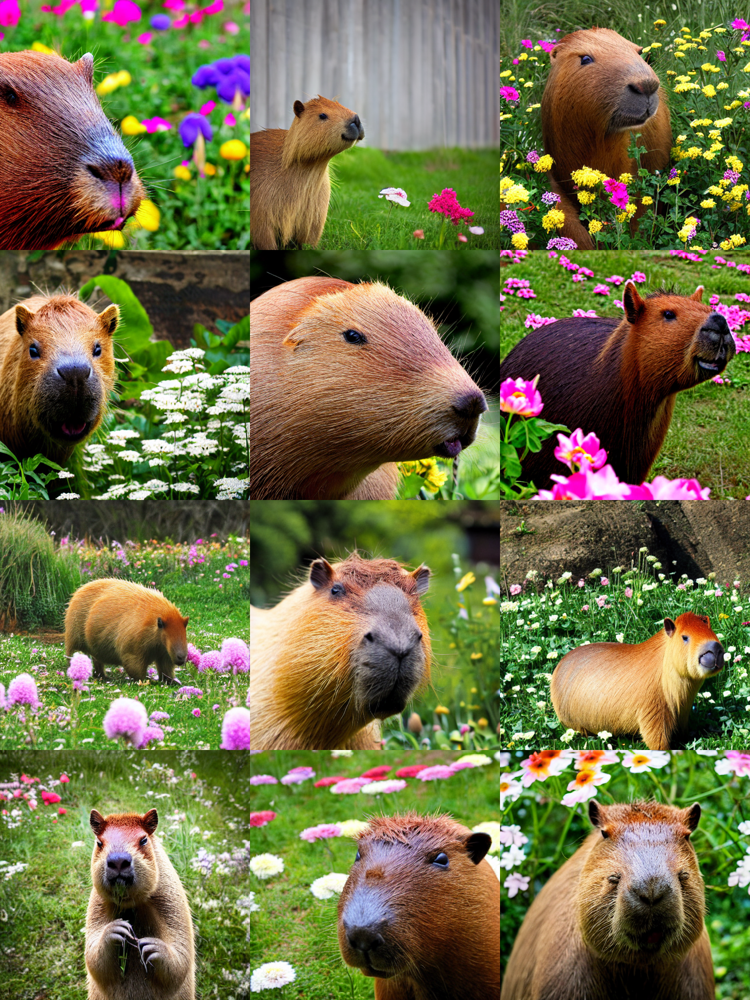

In [30]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of a capybara with flowers"] * num_cols

all_images = []
for i in range(num_rows):
  with autocast("cuda"):
    images = pipe(prompt)["images"]
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

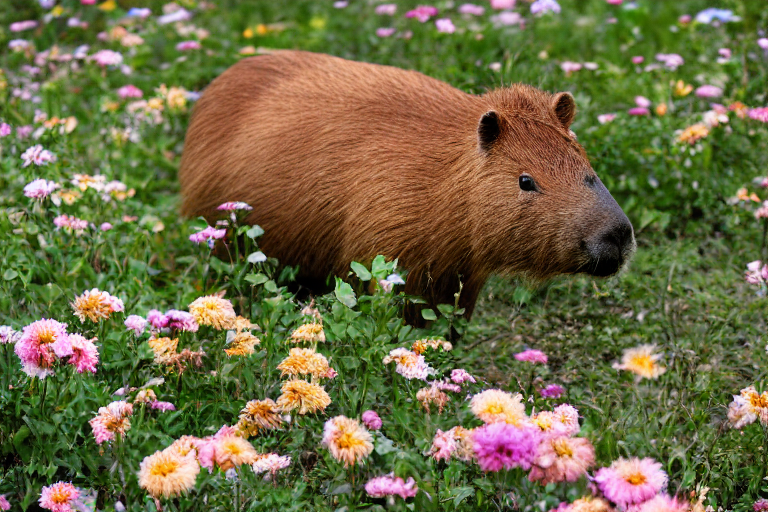

In [32]:
prompt = "a photograph of a capybara with flowers"
with autocast("cuda"):
  image = pipe(prompt, height=512, width=768)["images"][0]
image